<a href="https://colab.research.google.com/github/janchorowski/ml_uwr/blob/fall2020/lectures/07_nodes_dt.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Machine Learning @ UWr 2020

**Lecture 07**

In this note we will explore tree models for classification and regression. First, we will learn about the Decision Tree: a fast, and quite accurate model that is also interpretable.
Next, we will explore ensembles of trees, especially two very popular variants:
- the Random Forest, a very robust and easy to use classifier
- Boosted trees, a state-of-the art tree classifier which wins nearly half of kaggle competitions (the other half is won using convolutional neural networks, and I invite you to my deep learning course to learn about them!)

We will begin with an intuitive explanation of what are decision trees.

Let's once again load the Iris dataset, and make yet another attempt at telling the flowers from each other!

In [ ]:
import os
import sys

import httpimport
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.stats as sstats
import seaborn as sns
import sklearn.linear_model
from matplotlib import animation
from matplotlib import pyplot as plt
from matplotlib import rc
from sklearn import datasets
from sklearn.model_selection import KFold, train_test_split
from statsmodels.stats.proportion import proportion_confint

from graphviz import Digraph

with httpimport.github_repo(
    "janchorowski", "nn_assignments", module="common", branch="nn18"
):
    from common.plotting import plot_mat

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


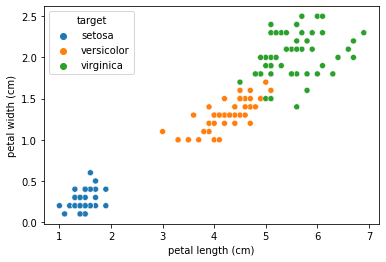

In [ ]:
# Load Iris data
iris = sklearn.datasets.load_iris()
iris_df = pd.DataFrame(iris.data, columns=iris.feature_names)
iris_df["target"] = pd.Categorical(iris.target_names[iris.target])


# Load Mushroom data
# fmt:off
columns = [
 "target", "cap-shape", "cap-surface", "cap-color", "bruises?", "odor", 
 "gill-attachment", "gill-spacing", "gill-size", "gill-color", "stalk-shape", 
 "stalk-root", "stalk-surface-above-ring", "stalk-surface-below-ring", 
 "stalk-color-above-ring", "stalk-color-below-ring", "veil-type", "veil-color", 
 "ring-number", "ring-type", "spore-print-color", "population", "habitat", ]
# fmt:on
url = "http://archive.ics.uci.edu/ml/machine-learning-databases/mushroom/agaricus-lepiota.data"
mushroom_df = pd.read_csv(url, header=None, names=columns)
# Special dataset - we add the row number (index) as an extra feature
mushroom_idx_df = mushroom_df.reset_index()
mushroom_idx_df["index_col"] = [str(i) for i in mushroom_idx_df.index]

# Load old US Congress voting data
vote_df = (
    pd.read_csv(
        "https://pkgstore.datahub.io/machine-learning/vote/vote_csv/data/65f1736301dee4a2ad032abfe2a61acb/vote_csv.csv"
    )
    .rename({"Class": "target"}, axis=1)
    .fillna("na")
)

# Finally replot the Iris data
sns.scatterplot(data=iris_df, x="petal length (cm)", y="petal width (cm)", hue="target")

## Decision Tree Intuitions

Looking at the plot above, we could e.g. write the following set of conditions to classify irises:

```python
if petal_length < 2.5:
    return 'Setosa'
else:
    if petal_width > 1.8:
        return 'Virginica'
    else:
        if petal_length < 5.2:
            return 'Versicolor'
        else:
            return 'Virginica'

```

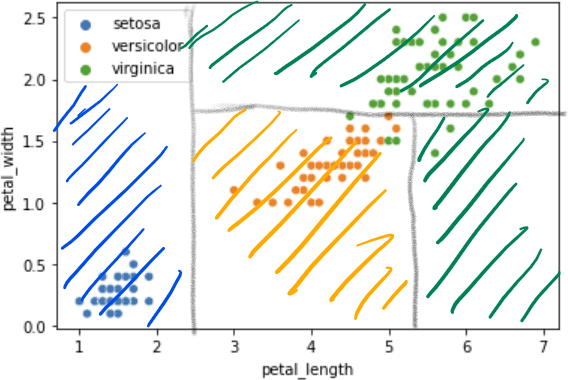

The `if-else` tree yields a separation of the data as shown above.

We can observe a few facts:
1. Each `if` makes a cut of the space.
2. Each cut is parallel to an axis.
3. The full tree divides the whole space into boxes.
4. The contents of each box are assigned to one class.
5. A deep `if-else` tree may place one box around each datapoint, resulting in perfect data classification.

We will henceforth call the `if-else` tree a _Decision Tree_. A decision tree is a rooted tree in which:
1. All internal nodes contain a data split,
2. Leaf nodes classify the data.

A sufficiently deep decision tree will always yield a 100% training classification accuracy (provided no two data samples with conflicting classes have exactly the same features). However, a good tree should also have a good predictive accurracy. It is typically assummed that if a shallow tree does well on the training data, it will also generalize well. Our goal is thus to find trees which are small, and have good performance on the training set. Small trees are also interpretable - they can be shown to humans and reasoned about.

Unfortunately, exactly finding the smallest tree with a given training accurracy is a difficult combinatorial problem. However, the following greedy algorithm often works surprisingly well:

```python
def build_tree(D: Dataset):
    """Build a Decision Tree until leaves are pure."""
    if D contains samples from one class:
        return LeafNode(D)
    else:
        1. choose a splitting criterion c
        2. split D into two subsets:
            - D_true containing samples from D on which c is True
            - D_false containing samples from D on which c is False
        return SplitNode(c, build_tree(D_true), build_tree(D_false))
```

The algorithm first inspects the data sample on which it is called. If the sample is _pure_, i.e. it contains samples from one class only, a leaf node is created.

If the node is impure, a splitting criterion (also called test) is selected. It divides the training data into two (sometimes more) parts. Hopefully, these subsets are purer. The algorithm recursively builds trees on the subsets, then adds a `SplitNode`.

To turn the pseudocode above into a full tree-building algorithm, we need to specify the set of available splitting criteria and a selection method.
Since choosing the best split requires computing the outcomes of all tests under consideration, pracitcal algorithms typically limit the choice to only a couple of possiblities:
1. For categorical (discrete) variables, do one of:
    - introduce a subtree for each value the feature may take (used in C4.5)
    - separate one value from the others
    - split the values into two groups (CART's approach)
2. For continuous variables a splitting criterion is a threshold: values below it go to one branch, and values above it go to the other one.

### Purity criterion

A good split should result in subtrees which are purer that their parent node. For our first try, we will measure data impurity as the error rate of a majority classifier. 

Let $\pi_c = p(y=c|t)$ be the class distribution in tree node $t$. Then the misclassification rate is
$$
i_E(t) = 1-\max_{c}\pi_c
$$

Below we show the missclasification for a node containing a mixture of two classes.

Text(0.5, 0, 'Class balance')

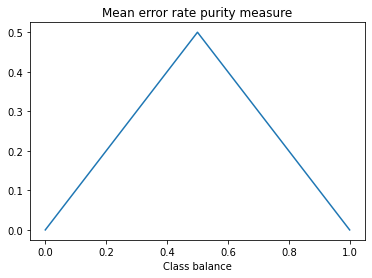

In [ ]:
def mean_err_rate(counts):
    """Compute the error rate of a majority classifier.
    
    Counts is a pandas.Series which gives the counts of all possible target values.
    """
    s = counts.sum()
    p = counts / s
    return 1 - p.max()


fractions = np.linspace(0, 1, 101)
# We have to do a for loop, because we will be supplying pandas series later on
err_rates = [mean_err_rate(np.array([f, 1.0-f])) for f in fractions]
plt.plot(fractions, err_rates)
plt.title("Mean error rate purity measure")
plt.xlabel("Class balance")

From the plot above we can see, that the error rate is zero for pure datasets and linearly rises to 0.5 for a dataset with equal proportions of two classes.

This linear increase of impurity is, however, undesirable. Consider again the iris dataset. Intuitively, the best threshold along the `petal length` feature would separate the setosas from the other species. This results in the following subtrees:

|                    | setosa | versicolor | virginica | mean_error_rate |
|:------------------:|:------:|:----------:|:---------:|:---------------:|
| petal length $\leq 2.5$ | 50     | 0          | 0         | $\frac{0}{50}$ |
| petal length $> 2.5$ | 0     | 50          | 50         | $\frac{50}{100}$ |

The weighted purity for this split is $\frac{50\frac{0}{50} + 100\frac{50}{100}}{150}=0.33$

However, now consider a split which setarates all setosas, but mixes them with some versicolors:

|                    | setosa | versicolor | virginica | mean_error_rate |
|:------------------:|:------:|:----------:|:---------:|:---------------:|
| petal length $\leq 4$ | 50     | 11          | 0         | $\frac{11}{61}$ |
| petal length $> 4$ | 0     | 39          | 50         | $\frac{39}{89}$ |

The weighted purity for this split is $\frac{61\frac{11}{61} + 89\frac{39}{89}}{150}=0.33$.

The mean error rate criterion doesn't differentiate between these two splits! The problem is, that for a wide range of values a change of the threshold moves erroneous samples from one subset to the other, however the total error count is unchanged, and the mean accurracy criterion doesn't differentiate between them.

We can see this problem on the plot below: the minimum error rate spans a range of thresholds, without a clear indication which one should be selected.



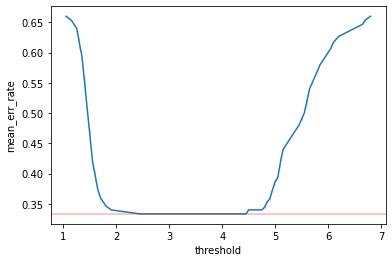

In [ ]:
def plot_numerical_split_purity(df, feature, purity_measure):
    """Get the best split for a numerical variable.

    Iterate over all possible thresholds, and record the mean purity of the split.
    """
    measure_name = purity_measure.__name__
    df_sorted = df.sort_values(feature)

    # Class counts
    counts_above_th = df_sorted.target.value_counts()
    counts_below_th = 0 * counts_above_th

    mean_impurities = []

    old_threshold = df_sorted[feature].iloc[0]
    for _, row in df_sorted.iterrows():
        threshold = row[feature]
        err_rate_below_th = purity_measure(counts_below_th)
        err_rate_above_th = purity_measure(counts_above_th)

        mean_impurities.append(
            {
                # put the threshold between two data points
                "threshold": 0.5 * (old_threshold + threshold),
                # awerage child purities weighting by their size
                measure_name: (
                    err_rate_below_th * counts_below_th.sum()
                    + err_rate_above_th * counts_above_th.sum()
                )
                / len(df_sorted),
            }
        )
        old_threshold = threshold

        # Now get the target class and move one sample from the subset above the
        # threshold to the subset below it
        counts_below_th[row["target"]] += 1
        counts_above_th[row["target"]] -= 1

    mean_impurities = pd.DataFrame(mean_impurities)
    sns.lineplot(data=mean_impurities, x="threshold", y=measure_name)
    min_imp = mean_impurities[measure_name].min()
    plt.axhline(min_imp, color="r", alpha=0.3)


plot_numerical_split_purity(iris_df, "petal length (cm)", mean_err_rate)

### Practical purity measures

We need a criterion in which the tree impurity increases faster than linearly. Two possibilities, which have been developed respectively in the statistical and machine learning communities and which have been extensively used are the Gini Impurity $i_G$ and Entropy $i_H$. Recall that $\pi_c = p(y=c|t)$ is the class distribution in tree node $t$. The measures are:
- the [Gini Impurity measure](https://en.wikipedia.org/wiki/Decision_tree_learning#Gini_impurity)
    $$
    i_G(t) = \sum_{c}\pi_c(1-\pi_c) = 1-\sum_c\pi_c^2
    $$
    
    the Gini coefficient can be interpreted as the average number of errors introduced, when we change the class of each element to the class of another one. The purer the node, the more often the exchange will do nothing, in particular for pure nodes the Gini impurity is 0.

- the [Entropy](https://en.wikipedia.org/wiki/Entropy)
    $$
    i_H(t) = -\sum_c\pi_c\log\pi_c
    $$

    where we assume that $\lim_{x\rightarrow 0+} x\log x=0$.

    The reduction of the entropy, i.e. the difference between the entropy of a parent node and the mean entropy of its children is called the [Information Gain](https://en.wikipedia.org/wiki/Decision_tree_learning#Gini_impurityInformation_gain), which is equivalent to the [Mutual Information](https://en.wikipedia.org/wiki/Mutual_information) between the binary variable describing the split and the targets. It is often use as a dependency measure for feature selection.

The plot below compares the three impurity measures. We can see that all are concave, hovewer for Gini and Entropy the change of the measure doesn't grow linearly with the change of class proportions. The shape of the Gini and Entropy criteria is very similar and they perform similarly in practice.

Text(0.5, 1.0, 'Comparison of purity measures')

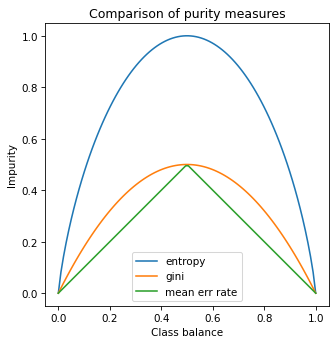

In [ ]:
# @title Purity function comparison
This is a homework assignment


Let's re-evaluate the split along `petal length` using gini and entropy criterions. We can see that this time the impurity attains an optimum value at $2.5$, a location which splits out all setosas. The next local optimum is near $5$ where the versicolors can be separated from the virginicas.

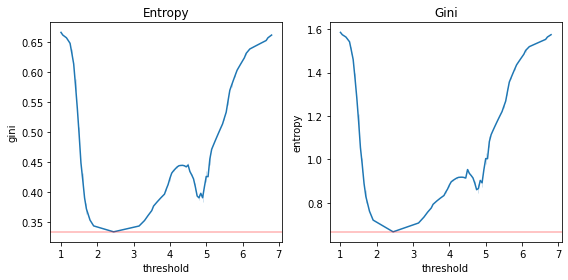

In [ ]:
plt.figure(figsize=(8,4))
plt.subplot(121)
plot_numerical_split_purity(iris_df, "petal length (cm)", gini)
plt.title("Entropy")
plt.subplot(122)
plot_numerical_split_purity(iris_df, "petal length (cm)", entropy)
plt.title("Gini")
plt.tight_layout()

Let's now build and visualize the full tree for Irises (restricted only to petal dimensions).

In [ ]:
# @title Tree implementation

Tree building code is parto of homework


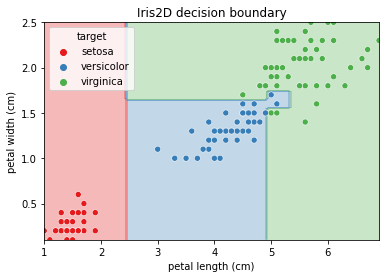

In [ ]:
# Dec tree for 2D Iris
iris2d = iris_df[["petal length (cm)", "petal width (cm)", "target"]]
iris2d_tree = Tree(iris2d, print_info=True)
draw_tree_boundary(iris2d_tree)

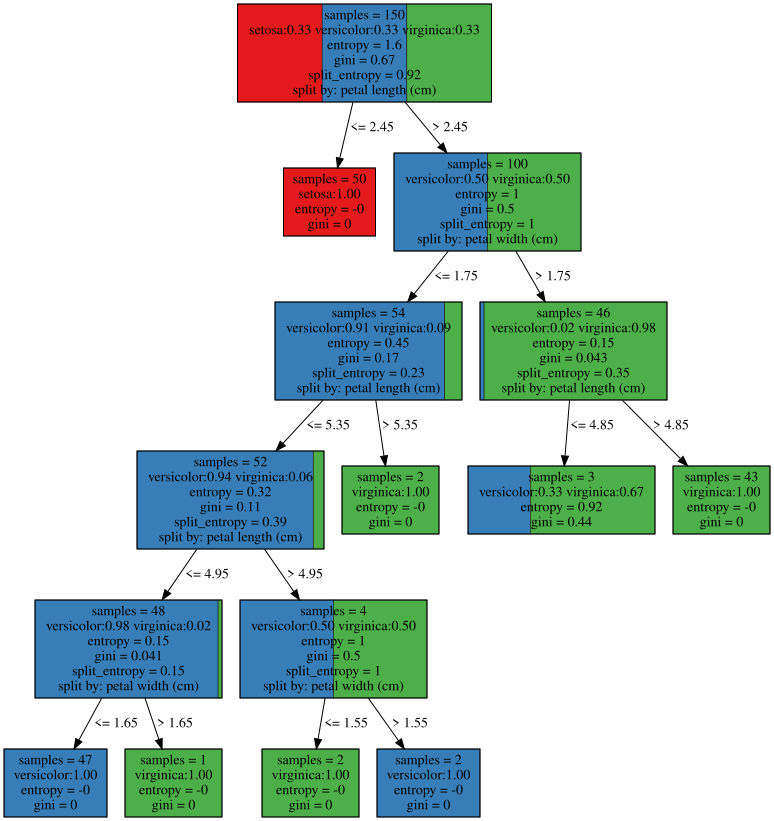

In [ ]:
# Plot the tree itself
iris2d_tree.draw()

We can see that the tree indeed first chooses to separate the Setosas and then uses several splits to draw the boundary between Versiciors and Virginicas.

## Detour: a more detailed look at entropy

Let $X$ be a discrete random variable (RV) taking values from set $\mathcal{X}$ with probability mass function $P(X)$.

*Definition* the entropy $H(X)$ of the discrete random variable $X$ is
\begin{equation}
H(X) = \sum_{x\in\mathcal{X}}P(X)\log \frac{1}{P(X)} = -\sum_{x\in\mathcal{X}}P(X)\log P(X).
\end{equation}

How to make sense out of this definition? We will, rather informally, argue below that the entrpy of an RV provides a lower bound on the amount of information provided by the RV, which we'll dfine as the average number of bits required to transmit the value the RV has taken.

As a motivating example consider asking your friend for advice. The probabilities of his answers are given in the table below:

| $x$      | $P(x)$ |
|----------|--------|
| OK       | $1/2$  |
| Average  | $1/4$  |
| Bad      | $1/8$  |
| Terrible | $1/8$  |

To transmit the answer of your friend you must introduce an *encoding*, e.g.:

| $x$      | $P(x)$ | Code 1 |
|----------|--------|--------|
| OK       | $1/2$  | 00     |
| Average  | $1/4$  | 01     |
| Bad      | $1/8$  | 10     |
| Terrible | $1/8$  | 11     |

Under this encoding, we spend 2 bits per answer.

However, we could also consider a variable length code, that uses shorter codewords for more frequent symbols:

| $x$      | $P(x)$ | Code 2 |
|----------|--------|--------|
| OK       | $1/2$  | 0      |
| Average  | $1/4$  | 10     |
| Bad      | $1/8$  | 110    |
| Terrible | $1/8$  | 111    |

Under this encoding the average number of bits to encode an answer is:
\begin{equation}
\mathbb{E}[L] = \frac{1}{2} \cdot 1 + \frac{1}{4} \cdot 2 + \frac{1}{8} \cdot 3 + \frac{1}{8} \cdot 3 = \frac{7}{8}
\end{equation}

Thus, the new code is (on the average) more efficient. Is it the best we can do?

### The code space

We'll now try formalize the coding task, i.e. the assignment of code lengths to possible values of the RV. 

Let's first observe an important property of our code: in a variable length coding, no codeword can be the prefix of another one. Otherwise, decoding is not deterministic. Therefore, whenever a value is assigned a symbol of length $L$, $1/2^L$ of the code space is reserved and not available to other codes.

This can be visualised as a code space. Below, we indicate the codes assigned to symbols in the example and  grey-out codes that are not available because the shorter codes are used:

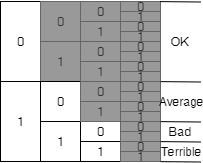

We can observe, that the length 1 code for "OK" uses $1/2$ of the available codes, the length 2 code for "Average" uses $1/4$ and the two length 3 codes for "Bad" and "Terrible" each use $1/8$ of the code space.

In general, a code of length $L$ uses $1/2^L$ of the code space. Equivalently, assignign a fraction $f$ of the code space to a symbol makes it use a symbol of length $L=\log_2(1/f)$.

Assuming that we assign a fraction of a bit to a symbol, our optimal coding problem can be formulated as partitioning the code space into four regions (one for each value of the RV) such that the average length of the code is minimized. 

Formally, let $p_1, p_2, p_3, p_4$ be the probabilities asigned to the 4 symbols and let $f_1, f_2, f_3, f_4$ be the coding space fractions assigned to them.

We want to:
\begin{align}
\text{minimize } &p_1 \log_2 \frac{1}{f_1} +  p_2 \log_2 \frac{1}{f_2} + p_3 \log_2 \frac{1}{f_3} + p_4 \log_2 \frac{1}{f_4} \\
\text{subject to: } & f_1 + f_2 + f_3 + f_4 = 1
\end{align}

For simplicity, we will solve this problem for the case of only two symbols:
\begin{align}
\text{minimize } &p_1 \log_2 \frac{1}{f_1} +  p_2 \log_2 \frac{1}{f_2} \\
\text{subject to: } & f_1 + f_2 = 1
\end{align}

Notice first that $p_2 = 1-p_1$ and likewise $f_2 = 1-f_1$. Then our minimization objective becomes
\begin{equation}
\text{minimize } C = p_1 \log_2 \frac{1}{f_1} +  (1-p_1) \log_2 \frac{1}{1-f_1} 
\end{equation}

To get the minimum over $f_1$ we compute the derivative of the expression with respect to $f_1$ and set it to zero:
\begin{equation}
\frac{\partial C}{\partial f_1} = \frac{p_1}{\log 2}\frac{-1}{f_1} + \frac{1 - p_1}{\log 2}\frac{1}{1 - f_1}
\end{equation}

Multiplying both sides by $\log 2 f_1 (1- f_1)$ we obtain:
\begin{align}
p_1(1-f_1) &= (1-p_1)f_1 \\
p_1 - p_1f_1 & =f_1 - p_1f_1 \\
f_1 &= p_1
\end{align}

Thus, the optimal fraction of code space allocated to symbol 1 is $p_1$, the probability assigned to this symbol and the optimal code length is $\log_2(\frac{1}{p_1})$!

We now see, that the entropy 
\begin{equation}
H(X) = \sum_{x\in\mathcal{X}}P(X)\log \frac{1}{P(X)}
\end{equation}
is simply the average code length!

### A note about logarithm basis

It is custommary to compute the entropy using natural logarithms, which gives its value in "nats". If $\log_2$ were used, the entropy has units of bits and corresponds and lowerbounds the average amount of bits needed to transmit a value of the RV.

### Conditional Entropy and Mutual Information

We can compute the expectation of entropy of a random variable $Y$ when conditioned on $X$. We call this value the _conditional entropy_:
$$
\begin{split}
H(Y|X) &= \mathbb{E}_{x}[H(Y|X=x)] = \\
&=\sum_x p(x)H(Y|X=x) = -\sum_x p(x)\sum_y p(y|x)\log p(y|x).
\end{split}
$$

If $Y$ and $X$ are related, the conditional entropy $H(Y|X)$ will be lower than the entropy $H(Y)$, because intuitivelly, knowing $X$ tells us something about $Y$, and hence, the randomness (entropy) must decrease. The difference between the marginal entropy of $Y$ and the conditional entropy is called the _mutual information_ between $Y$ and $X$:

$$
\begin{split}
I(X;Y) &\equiv H(Y) - H(Y|X) \equiv \\
&\equiv H(Y) - H(Y|X) \equiv \\
&\equiv H(X) - H(X|Y) \equiv \\
&\equiv H(X) + H(Y) - H(Y, X) \equiv \\
&\equiv H(Y, X) - H(Y|X) - H(X|Y)
\end{split}
$$

Mutual information is 0 if and only if the two variables are independent. Unlike correlation, it is sensitive to all kinds of dependencies. However, it is harder to compute, especially between continuous variables.

The above relations between the entropies and mututal information are easy to remeber by inspecting their [Wenn diagram](https://en.wikipedia.org/wiki/Mutual_information):

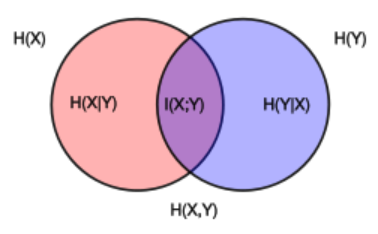

### Entropy properties (for discrete RV)

* $H(X) \geq 0$: the entropy (for a discrete random variable) is always non-negative

* $H(Y|X) = 0$ iff $Y$ is fully specified by $X$

* $H(Y|X) = H(Y)$ iff $Y$ and $X$ are independent.

* $H(X,Y) \leq H(X) + H(Y)$.


### Entropy for continuous RV

The analog of entropy for continuous variables is called _differntial entropy_:

$$
H(X) = -\int f_X(x)\log f_X(x) dx.
$$

Unlike entropy, differential entropy can be negative!

### Entropy and Decision Trees

In the homework assignment you were given a set of 12 balls, in which 11 were identical and 1 was odd (either heavier or lighter). The task was to provide the shortest sequence of measurements using a balance that would indicate the odd ball.

This is similar to building Decision Trees - each step of your procedure performs a test on the balls, and rules out some possibilities. One strategy to perform the tests is to maximize the entropy of the outcome. Consider two variants for the first weighting:
1. you split the balls into two sets of 6, which you weigth against each other.
2. you split the balls into 3 sets of 4, put one aside and weight the remaining two against each other.

The first case can have two outcomes:
1. Left scale goes down
2. Right scale goes down

Both are equally probable and the entropy of the outcome is exactly 1 bit.

On the other hand, the second strategy can have three outcomes:
1. the balance is even, with probability 1/3 (happens if the odd ball is one of the 4 which were left out)
2. the left scale goes down, with prob $2/3 \cdot 1/2 = 1/3$ (there is 2/3 chance that the balanace will not be even, both cases are equally probable).
3. the right scale goes down, again with prob 1/3.

The entropy for this weighting is $\log2(3)=1.58$ bits.

Thus, the seond split conveys more information. Additionally, before the weightings begin the entropy of the system is $\log_2(24)=4.58$ bits (all twelve balls are odd with the same probabitlity and we don't know if the odd ball is lighter or heavier). Maximum information gained with one weighting is 1.58, thus we can't do better than 3 weightings. However, to reach this result, all weightings must be chosen close to optimal.

Let's now get back to Decision Trees in Machine Learning.
Consider a tree node $T$ split into child nodes $C_1, C_2, ..., C_N$ using a splitting criterion $S$.

Let $H(T)$ be the entropy of the targets in node $T$ and $H(C_i)$ be the entropy of the targets in the child node $C_i$.

We have measured split purity as the mean entropy of the children:
$$ 
P = \sum_i \frac{|C_i|}{|T|}H(C_i).
$$

This is the same as the conditional entropy of the classification target, given the split variable. Moreover, the difference between the node's entropy and the mean child entropy is, by definition, the mutual information betweeen the class targets and the splitting variable. Therefore decision trees can be interpreted to perform a greedy, local feature selection based on the mutual information between the split variable and the target!


### Entropy Further Reading
1. Chris Olah "Visual Information theory": https://colah.github.io/posts/2015-09-Visual-Information/
2. JA Thomas ad TM Cover, "Elements of Information Theory", chapter 2

## Decision Trees: Categorical splits

So far, we have seen how to implement a split over a continuous variable: the splitting criterion compares an attribute's value to a threshold. The best split is selected by considering all possible thresholds.

Discrete variables can be handled in an even simpler way: we simply introduce a subtree for all possible values an attribute may take.

Let's see this in action!

We will use a dataset about mushrooms: the task is to categorize each mushroom into an **e**dible or **p**oisonous one based on several discrete attributes.

In [ ]:
mushroom_df.head()

,target,cap-shape,cap-surface,cap-color,bruises?,odor,gill-attachment,gill-spacing,gill-size,gill-color,stalk-shape,stalk-root,stalk-surface-above-ring,stalk-surface-below-ring,stalk-color-above-ring,stalk-color-below-ring,veil-type,veil-color,ring-number,ring-type,spore-print-color,population,habitat
0,p,x,s,n,t,p,f,c,n,k,e,e,s,s,w,w,p,w,o,p,k,s,u
1,e,x,s,y,t,a,f,c,b,k,e,c,s,s,w,w,p,w,o,p,n,n,g
2,e,b,s,w,t,l,f,c,b,n,e,c,s,s,w,w,p,w,o,p,n,n,m
3,p,x,y,w,t,p,f,c,n,n,e,e,s,s,w,w,p,w,o,p,k,s,u
4,e,x,s,g,f,n,f,w,b,k,t,e,s,s,w,w,p,w,o,e,n,a,g


We can see that a shallow tree is sufficient to categorize all mushrooms, with the most information provided by the `odor` column.

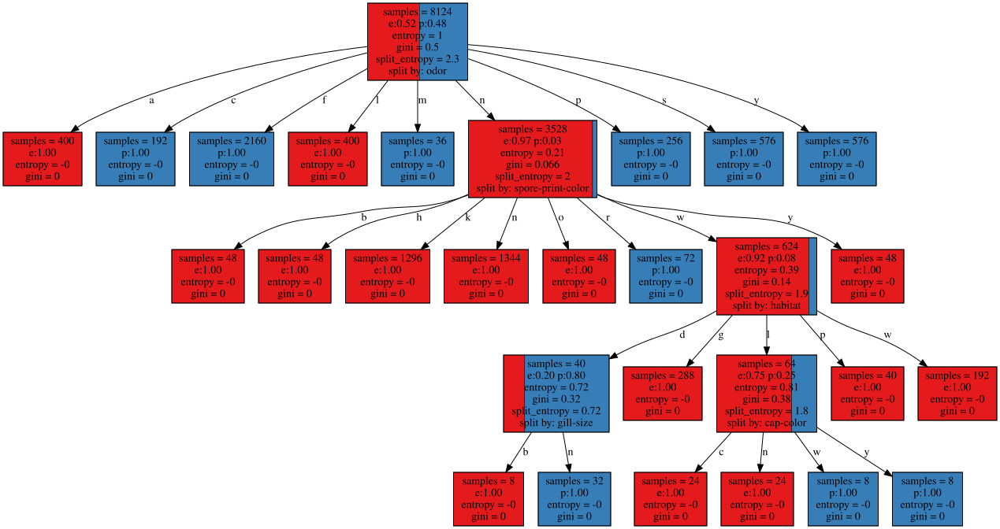

In [ ]:
tree = Tree(mushroom_df, criterion="infogain")
tree.draw()

### InfoGain ratio or the danger of multiway splits

The mutual information can be large for splits on features that have multiple values. In an extreme case, splitting on a column with unique values, such as the row index, will create one-element subtrees which are trivially pure.

This follows directly from the properties of mutual information. Let $T$ be the target and $A$ an attribute. Recall that

$$
H(T) = I(T;A) + H(T|A) 
$$

and that all the quantities are non-negative. If $A$ takes many values all the subtrees will be small, and possibly pure. In the extreme case in which $A$ has a unique value for each data sample, $H(T|A)=0$ because knowing $A$ determines the sample which deteremines its target.

Therefore, InfoGain (or mutual information) biases split selection towards  splits which result in many subtress.

One solution to this problem is to forbid multiway splits. However, this means that now each time we grow the tree we must perform an optimization over possible groupings of feature values. This is costly (though the Gini criterion allows faster search for subsets due to its structure). 

An alternative approach is to downweight multiway splits. This mechanism was introduced in the C4.5 tree algorithm by Quinlan. The intuition is as follows: the mutual information measures the amount of bits that the splitting attribute tells us about the target. However, we can also compute the information contained in the split itself To penalize multiway splits, we divide the mutual information by the entropy of the split. 


Let $T$ be a random variable denoting the target variable and $S$ a random variable indicating the split variable. Mutual information between $T$ and $S$ is
$$
I(T;S) = H(T) - H(T|S) = H(T) - \sum_s p(S=s) H(T|S=s)
$$

The entropy of the split variable is
$$
H(S) = -\sum_s p(S=s) \log p(S=s)
$$

The Mutual Information Ratio, or Information Gain Ratio is defined as
$$
IGR(T,S) = \frac{I(T;S)}{H(S)}
$$
we divide the information learned about the target when given the splitting atribute, by the information needed to specify the split outcome. Splits which result in many tiny subtress need more bits to specify the subtree and are downweighted.

In [ ]:
# Buiding a tree with the infogain (mutual information) crterion on data with
# columns that have multiple vales is prone to multiway splits.
# Here the data have an index column - the resulting depth one tree is useless!
tree = Tree(mushroom_idx_df, criterion="infogain")
tree.draw()

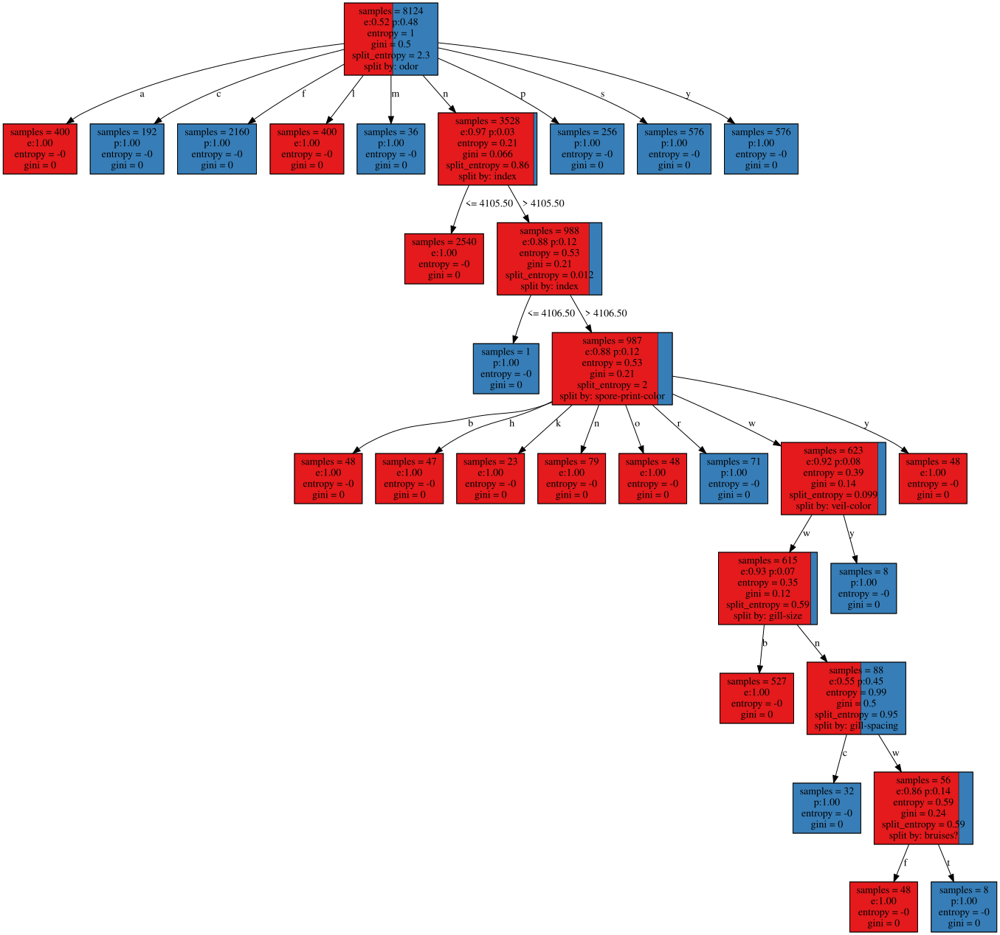

In [ ]:
# Downweighting multiway splits performed by the infogain criterion ignores
# The index attribute, building a more useful tree.
tree = Tree(mushroom_idx_df, criterion="infogain_ratio")
tree.draw()

### Decision Trees and real data

Consider the following small dataset:

|  $F_1$ |  $F_2$ | $F_3$ | $F_4$ |
|:------:|:------:|-------|-------|
|  white |  tall  | 0.1   | 20    |
|   ??   |  short | -2    | 41    |
|   red  | medium | 1.7   | 15    |
| orange |  tall  | 203   | ??    |

It has four features:
- $F_1$ is discrete (cateorical) and the categories hove no particular ordering,
- $F_2$ is discrete and ordered,
- $F_3$ is numerical.
- $F_4$ is numerical.

The data also have problems:
- $F_1$ and $F_4$ have missing values (indicated by `??`),
- $F_3$ possibly has outliers.

A practical learning algorithm should be able to deal with all these problems!
Decision Trees are no exception and are fairly robust:
- categorical variables are handled using multiway splits
- continuous variables are handled using threshold splits. These are only sensitive to the ordering of the samples, do not require normalization and, like all rank-based statistics, are robust to outliers
- ordinal variables can be treated like discrete ones and induce a multiway split or like contonuous variables, where a threshold is used.

Several strategies exist to handle missing values:
1. Each node can be extended with a substitute splitting criterion, used when the main split feature is unknown.
2. A default child can be used (this corresponds to a constant substitute split).
3. All subtrees can be evaluated, and their results averaged with weights proportional to their sizes. Intuitively, this procedure virtualy replicates the sample, weighting each replica by the frequency of the assigned value of the missing feature. This corresponds to computing the expectation over the distribution of the splitting feature estimated at the current node. Thus it corresponds to a contextual missing value imputation (replacement).

Finally, we observe that decisin trees perform an intrinsic important feature selection. Depending on the data, this may be seen as a feature or a bug:
- if the data contains a small set of features that determines the result, decision trees will most likely identify them, producing a classifier that disregards all other ones
- if the data requires that decisions be made by accumulating contributions from many noisy features, decision trees will usually work poorly: trees that use many features must be deep, and deep trees run into the small data problem: nodes choose their splits based on little data, which causes overfitting.

We will first look at tree pruning, or techniques designed to reduce the heigth of trees without impacting their performnce. We will then see how tree forests can alleviate problems with incorporating many weak signals.



### Decision Trees for regression

While these notes concentrate on classification tasks, decision trees can equally well be used for regression. A suitable purity measure, such as the standard deviation of samples within each node can be used to select splits. Leaves then return the mean value.


## Decision Tree evaluation and pruning

If no two samples have conflicting labels, a sufficiently deep decision tree will perfectly split the training set. However, as the tree grows, nodes contain very little data. Class distributions computed on these small nodes are noisy, and it is often possible to remove several nodes from a tree without affecting its performance. Thie procedure is called _tree pruning_.

It may seem wasteful to first grow a tree, and only then prune it. However, stopping tree growth is difficult if several variables are jointly needed to classify the data. In such cases several splits look badly, and only after all required variables are in the tree the data is separated. This is simliar to the problem of variable selection: if two variables interact, the effect of a single one may be negligible, and an early stopping algorithm may be tempted to stop prematurely. Therefore it is desirable to fully grow trees, and then walk up from the leaves pruning nodes.

We will first see an example, and then learn how exactly pruning can be performed.

Recall the tree build for the Iris data. Its decision boundary is complicated because it must outline the two versicolors which lie close to the setosas.

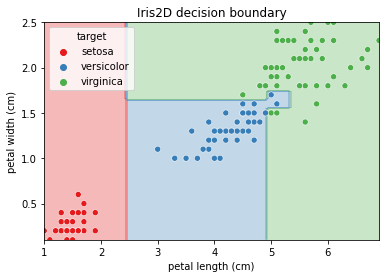

In [ ]:
# Dec tree for 2D Iris
iris2d_tree = Tree(iris2d, print_info=False)
draw_tree_boundary(iris2d_tree)

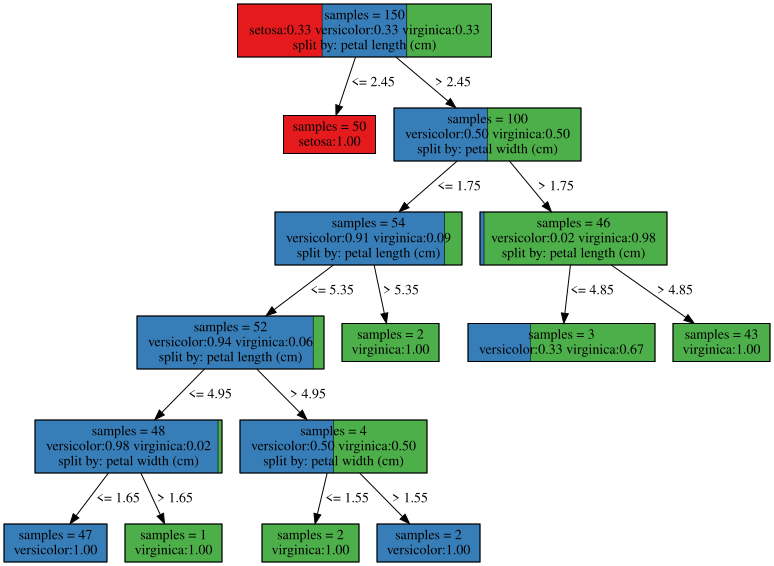

In [ ]:
iris2d_tree.draw()

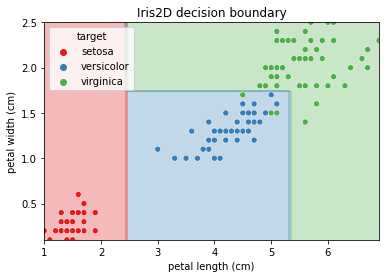

In [ ]:
compute_pessimistic_err_rates(iris2d_tree, prune=True, alpha=0.00001)
draw_tree_boundary(iris2d_tree)

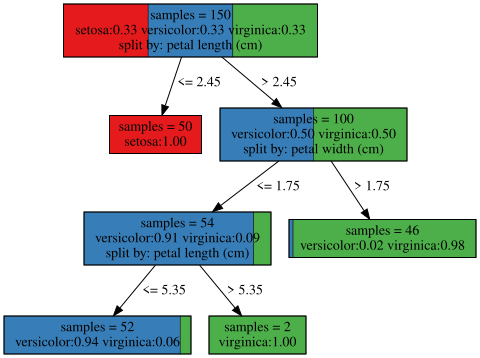

In [ ]:
iris2d_tree.draw()

We can notice that the new tree is smaller, and makes a few trainig errors. Since the data is noisy near the boundary, we may prefer the smaller tree hoping that it would generalize better. In other words, we are regularizing it, enforcing a tree size prior: we preffer smaller trees.

We will now learn how pruning can be implemented. Let's first observe that training a decision tree can be seen as taking two decision:
1. Choose a **tree topology**, i.e. what splits to make, and how big is the tree.
2. Choose **node parameters**, e.g. the target distribution in each node.

Topology and parameters yield statistics, such as expected error rates.

The decision tree building algorithm performs the two steps jointly - each time it selects a split, it assigns some data to all subtrees and they determine on the parameters.




### Reduced Error Pruning

We could take an existing tree, remove its node parameters and then fit them based on some other data, then use yet another data to estimate error rates. This forms the basis of _reduced error pruning_ (REP):
1. Train a tree on all data
2. Erase node parameters
3. Split the data into a cross-validation subsets
4. For each cross-validation fold:
    1. Estimate node parameters using the training folds
    2. Compute error rates on the test fold

After this procedure each node has a cross-validated error rate. We then remove children whose error rates are larger than the ratees of their parents.

We will perform a simplified REP procedure below. We first train a tree on a voting data. We keep a small test set for final evaluation.


Err rate: 6.1% with 39 nodes


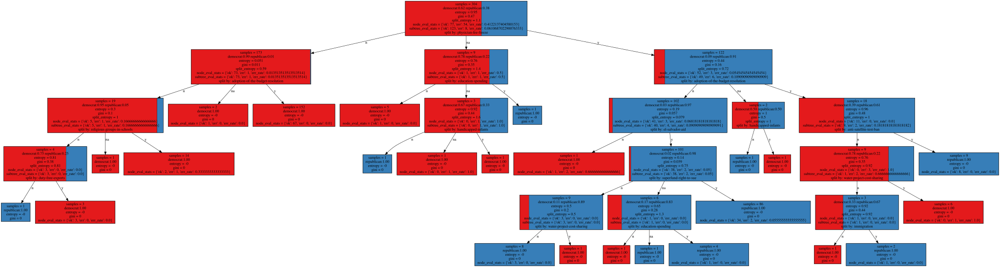

In [ ]:
train_df, test_df = train_test_split(vote_df, test_size=0.3)

tree = Tree(train_df, criterion="infogain_ratio", print_info=True)

# Now score all test samples and print the error rate
correct = 0
for _, row in test_df.iterrows():
    correct += score(tree, row)
print(f"Err rate: {(1 - correct/len(test_df))*100:.2}% with {tree.size()} nodes")

tree.draw()

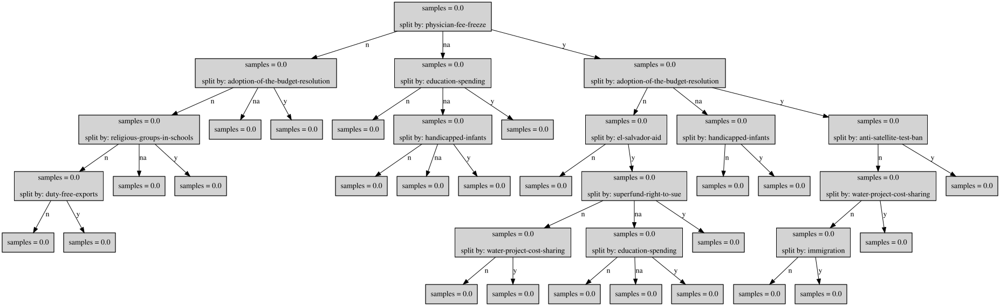

In [ ]:
# This is the tree with zeroed counts
reset_counts(tree, reset_stats=True)
tree.draw()

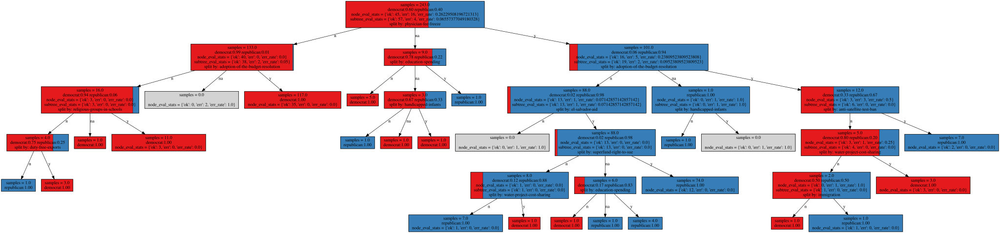

In [ ]:
# Re-estimate node statistics: perform only one round, to show that some nodes are not reached.
for cv_train_idx, cv_test_idx in KFold(n_splits=5).split(train_df):
    for _, sample in train_df.iloc[cv_train_idx].iterrows():
        count_sample(tree, sample)
    for _, sample in train_df.iloc[cv_test_idx].iterrows():
        score(tree, sample)
    break
tree.draw()

Now run a 5-fold error estimation:



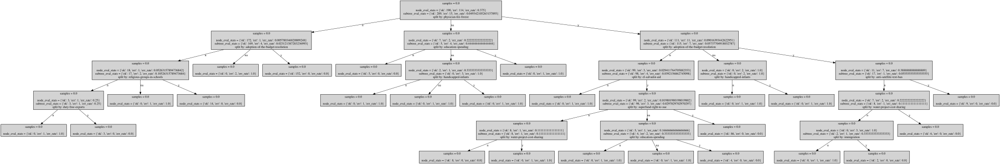

In [ ]:
reset_counts(tree, reset_stats=True)

for cv_train_idx, cv_test_idx in KFold(n_splits=5).split(train_df):
    for _, sample in train_df.iloc[cv_train_idx].iterrows():
        count_sample(tree, sample)
    for _, sample in train_df.iloc[cv_test_idx].iterrows():
        score(tree, sample)
    reset_counts(
        tree, reset_stats=False
    )  # reset node counts, but keep the error statistics
tree.draw()

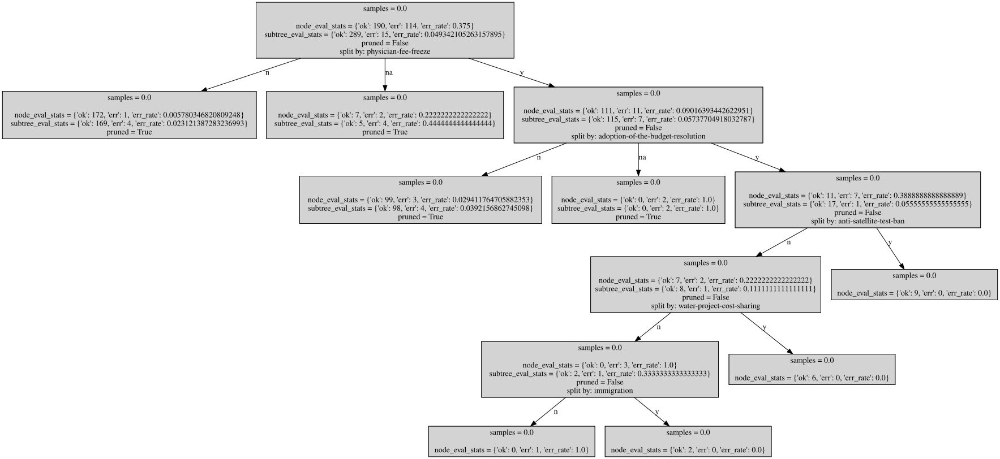

In [ ]:
prune_rep(tree)
tree.draw()

Err rate: 5.3% with 13 nodes


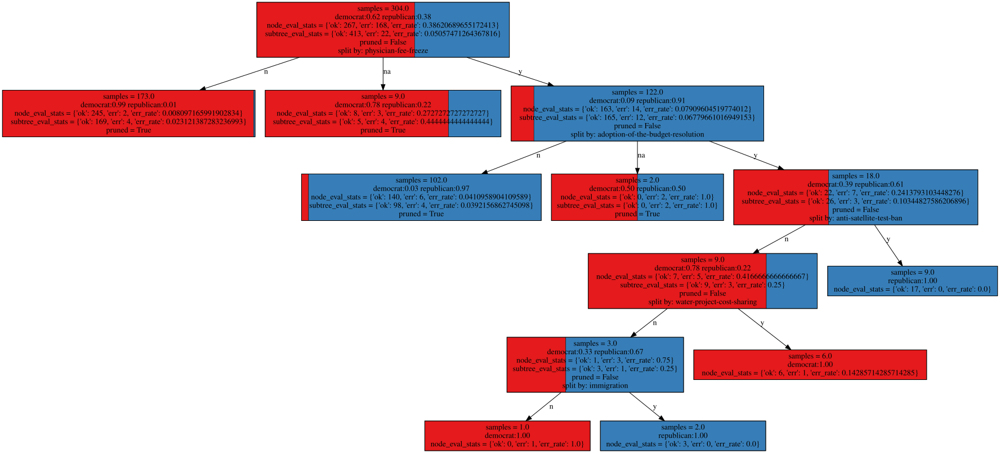

In [ ]:
# Finally, reestimate the node parameters in the pruned tree based on the full
# train set
for _, sample in train_df.iterrows():
    count_sample(tree, sample)

# Now score all test samples and print the error rate
correct = 0
for _, row in test_df.iterrows():
    correct += score(tree, row)
print(f"Err rate: {(1 - correct/len(test_df))*100:.2}% with {tree.size()} nodes")

tree.draw()

The pruned tree is small and similarly accurate to the original one (depending on the train-test split it may be slightly better or worse).


### Confidence-interval based pruning

REP pruning is slow, because it requires several passes through the tree. An approximate procedure, based on confidence intervals was proposed by Quinlan for C4.5. It uses as similar strategy to REP: first build a large tree, then estimate node error rates and remove subtrees which look worse than their parents.

In confidence-interval based pruning we estimate a node's error rate using its confidence interval upper bound at a given confidence (typically 95%). Thus, nodes with very few samples which are pure by chance will look worse than nodes which classify many samples with a little error.

Let's retrain the tree on the Voting dataset and prune it using this technique!

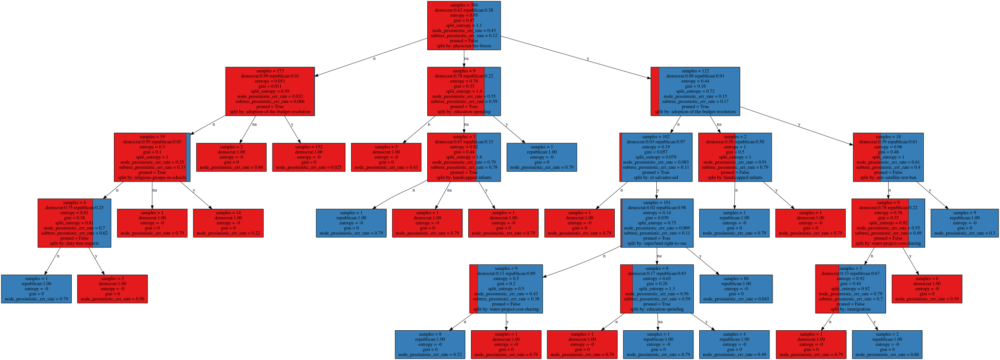

In [ ]:
# Train again the tree
tree = Tree(train_df, criterion="infogain_ratio", print_info=True)

# Compute upper confidence bounds on error rates, mark nodes that would be pruned.
compute_pessimistic_err_rates(tree, prune=False, alpha=0.05)
tree.draw()

Err rate: 6.106870229007633% with 17 nodes


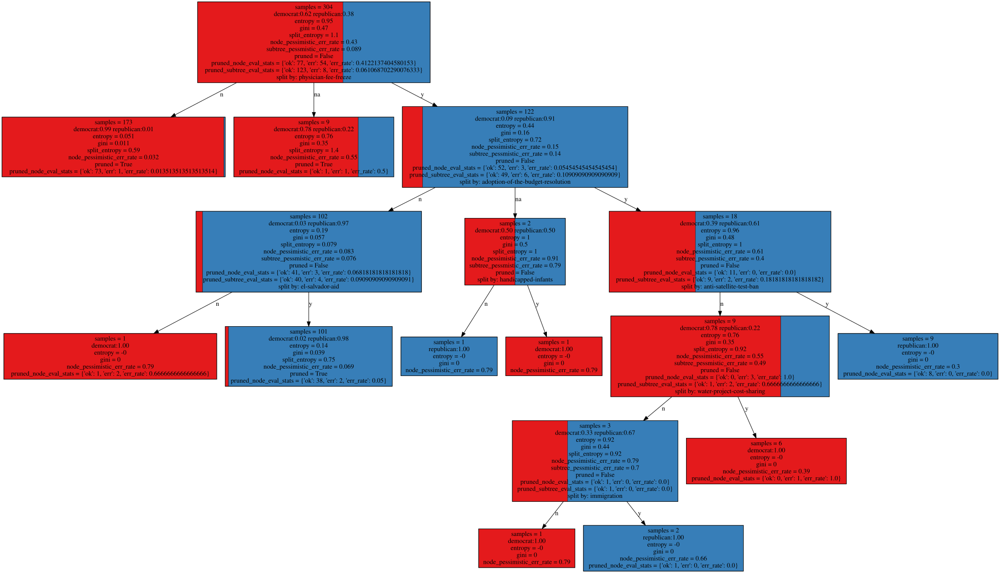

In [ ]:
# Now prune the tree, then record the error rate on pruned tree
compute_pessimistic_err_rates(tree, prune=True, alpha=0.05)
correct = 0
for _, row in test_df.iterrows():
    correct += score(tree, row, prefix="pruned_")
print(f"Err rate: {(1 - correct/len(test_df))*100:2}% with {tree.size()} nodes")
tree.draw()

## From trees to forests

A single tree is a reasonable classifier: fast to train and moderately accurate. However, as we have argued earlier, trees have a problem to extract information out of many noisy variables.

However, ensembles of trees, that is models in which we average out the answer of many trees might fare better. Intuitively, an ensemble of trees would perform well, if two conditions are met:
1. the trees are fairly accurate by themselves,
2. the trees make uncorrelated errors.

How can we train many different trees for the same task? The tree building algorithm is deterministic. However, we can learn different trees by:
1. training on different subsets of the data,
2. inject randomness into the training process,
3. build trees sequentially, forcing each to act differently than the previous ones.

The first solution (applicable to all classifiers, not only trees) works quite well on its own. A praticular implementation that we will describe next is called [_bagging_](https://link.springer.com/article/10.1007/BF00058655). It works best with classifiers which are unstable, that is with classifiers which produce different results when started in similar conditions. This usually means, that models are lightly regularized: trees are not pruned, regresion models don't have weight penalties. Intuitively, regularization stabilizes classifiers, making them more self-similar.

Making classifiers non-deterministic is a powerful way to decorrelate their errors. Some algorithms are naturally non-deterministic. For instance neural networks solve an optimization problem with many local minimas and different results are naturally obtained when training is started at different initial points.
Decision trees use a deterministic (though unstable) training algorithm, and additional randomness is often introduced by making split selection less greedy. For instance, trees inside a Random Forest greedily select the best split from a small (sometimes just 1!) set of features.

Below we will describe a very powerful combination of dataset randomization (using bagging) with random trees called [Random Forest](https://link.springer.com/article/10.1023/A:1010933404324). In the next set of notes we will look at sequential ensemble building schemes, which force classifiers to make decorreleated training errors.





### Classifier Bagging

Bagging employs a very simple approach to building models. Each model is obtained by:
1. Sampling a bootstrap training set: from a dataset of size N we sample with replacement N samples. The unselected samples are called out-of-bag and will be later used for performance estimation.
2. A classifier is built on the bootstrap training set.

After K rounds of bagging, the final prediction averages the outputs of the K classifiers.

Bagging provides an internal error estimator: the _out-of-bag_ error rate. In each round some samples are not selected for model training. We can put them through the model, and record the answers. When bagging ends, we average the out-of-bag decisions and compute the desired statistics.




In [ ]:
def bootstrap_indices(df):
    N = len(df)
    train_idx = np.random.randint(0, N - 1, size=(N,))
    oob_idx = np.ones((N,), dtype=bool)
    oob_idx[train_idx] = 0
    oob_idx = np.where(oob_idx)[0]
    return train_idx, oob_idx

In [ ]:
classify(iris2d_tree, iris2d.iloc[0])

'setosa'

OOB Err Rate from 100 trees: 4.0


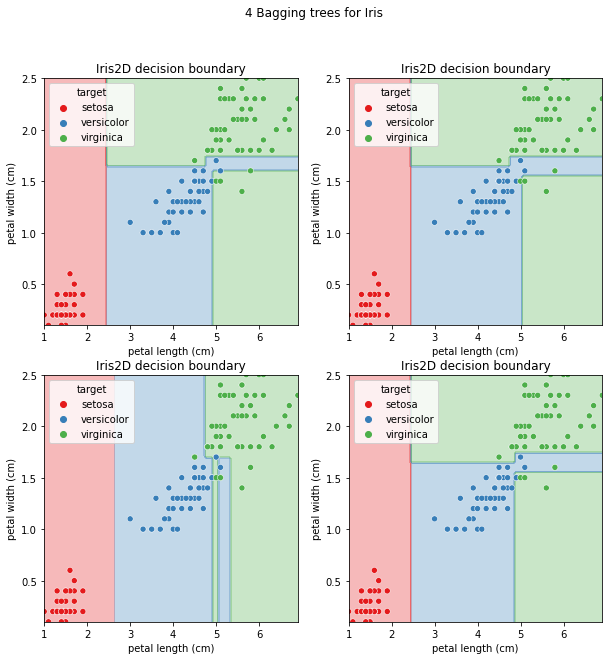

In [ ]:
plt.figure(figsize=(10, 10))
plt.suptitle("4 Bagging trees for Iris")

K = 100
oob_vote_counts = [
    pd.Series(data=0, index=iris2d.target.unique()) for _ in range(len(iris2d))
]

for r in range(K):
    train_idx, oob_idx = bootstrap_indices(iris2d)
    iris2d_tree = Tree(iris2d.iloc[train_idx], print_info=False)
    for idx in oob_idx:
        prediction = classify(iris2d_tree, iris2d.iloc[idx])
        oob_vote_counts[idx][prediction] += 1

    if r < 4:
        plt.subplot(2, 2, r + 1)
        draw_tree_boundary(iris2d_tree)

oob_preds = [counts.idxmax() for counts in oob_vote_counts]
print(f"OOB Err Rate from {K} trees: {(iris2d.target != oob_preds).mean()*100.0:.2}")

We can see that the trees are indeed different in the transition zone between versicolor and virginicas. However, they also very similar, for instance the first split is always along the petal length.

Forcing the tree to select to randomly select the splitting feature, then optimize the threshold introduces more variability. Additionally, growing trees is cheaper, because fewer features are considered for each split.

OOB Err Rate from 100 trees: 3.3


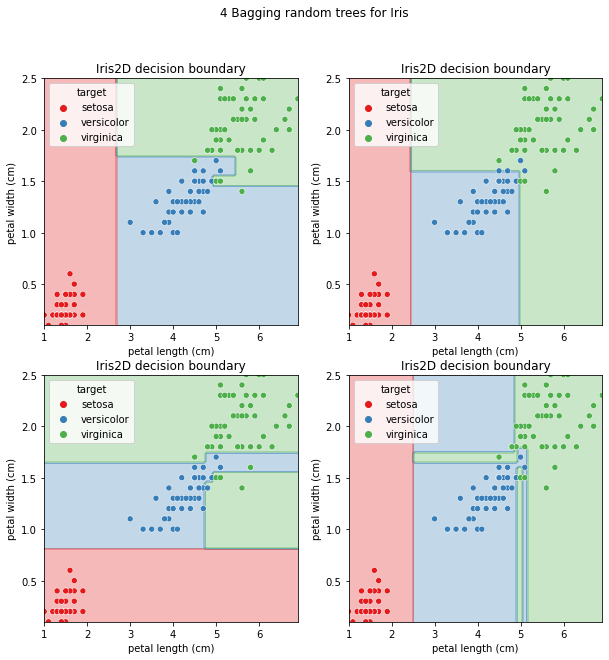

In [ ]:
plt.figure(figsize=(10, 10))
plt.suptitle("4 Bagging random trees for Iris")

K = 100
oob_vote_counts = [
    pd.Series(data=0, index=iris2d.target.unique()) for _ in range(len(iris2d))
]

for r in range(K):
    train_idx, oob_idx = bootstrap_indices(iris2d)
    # Crucial change: nattrs controls the number of attributes considered for each split
    iris2d_tree = Tree(iris2d.iloc[train_idx], print_info=False, nattrs=1)
    for idx in oob_idx:
        prediction = classify(iris2d_tree, iris2d.iloc[idx])
        oob_vote_counts[idx][prediction] += 1

    if r < 4:
        plt.subplot(2, 2, r + 1)
        draw_tree_boundary(iris2d_tree)

oob_preds = [counts.idxmax() for counts in oob_vote_counts]
print(f"OOB Err Rate from {K} trees: {(iris2d.target != oob_preds).mean()*100.0:.2}")

We can see that the randomized trees have more varied decision boundaries than the bagged greeedy ones. However, the individual trees remain strong. This causes the Random Forest classifier to perform exceptionally well.

The Random Forest is a very versatile classifier, and often a good first choice in initial data exploration:
1. It has only two hyperparameters:
    * Number of trees in the forest. This parameter is not too critical. Large forests are slower but don't overfit, thus one can add trees until the performance saturates.
    * Number of random attributes considered at each split. This is a critical, data-dependent parameter. Choosing the split from a small (even 1) number of features will decorreleate more the trees, but on datasets with many noisy, spurious variables will not be filtered out. On the other hand, setting it to a large number will make the tree building algorithm more greedy, and the trees more correlated. A good starting point is $\sqrt{\text{num features}}$.

2. Random Forest is resilient to data pathologies. Just like regular Decision Trees, it handles different attribute types, missing values and outliers.

  Random Forests can handle datasets with more features than data samples - this is challenging, because the problem is inherently ill-posed, because we have more degrees of freedom (more parameters) than constraints (data samples).

3. Random Forests can give confidence intervals and prediction probabilities - simply return the uncertainty of the votes of the ensemble.

4. Random Forest offers an internal error rate estimator, the out-of-bag error rate. It is an unbiased bootstrap estimate of the generalization error rate.

  Moreover, the OOB error can indicate us training data label confidence (samples with ambiguous OOB errors may be near the decision boundary) and outliers.

5. Random Forests offers decent variable importance measures. 

  A quick way to estimate a variable's importance is to compute the mean purity increase over all splits that involve this variable in the forest.

  A better, but more computationally involved importance measure the change of forest outputs when a feature's values are randomized. E.g. it is common to shuffle data in the attribute's column. By design, a RF explores how various combinations of features correlate with the target, the randomness helps it to escape always selecting the same features.

6. Random Forest offers a similarity measure for the data.
  
  Each tree in the forest can be seen as a function mapping data samples to nodes. Two data samples that are often belong to same nodes are similar.

  This similarity measure can sometimes be learnt without any labels, by solving a pseudo-task. One can, for instance prepare an artificial dataset by randomizing all attributes. A Random Forest is then trained to detect fake data from the original. The resulting forest yields variable importance metrics and data similarity measures.


